In [1]:
import pandas as pd
import plotly.express as px

In [2]:
ls

Patrick_Milestone1.ipynb  Untitled.ipynb            full_extract.csv*


In [3]:
tt = pd.read_csv('full_extract.csv')
tt.head()

,StateID,State,TweetID,CreatedDate,Lat,Lon,TwitterUserID,TwitterName,Followers,ShowID,ShowName
0,5,Nevada,450090458492854273,2014-03-29 22:01:42-04:00,36.173445,-115.061502,151680843,NUEMONEY,25485,2,Davincis Demons
1,7,New York,450089210834612224,2014-03-29 21:56:44-04:00,40.912401,-73.812712,155094607,Richie_Staz,497,2,Davincis Demons
2,5,Nevada,450108336025780225,2014-03-29 23:12:44-04:00,36.173445,-115.061502,151680843,NUEMONEY,25485,2,Davincis Demons
3,13,Texas,450072139006099456,2014-03-29 20:48:54-04:00,31.889186,-98.625780,2400672156,JadedSch,23,2,Davincis Demons
4,29,Georgia,450090930415370240,2014-03-29 22:03:34-04:00,33.777556,-84.384069,526761281,daylabaldwin,31,2,Davincis Demons


In [4]:
print("Number of entries (rows):", tt.shape[0])
print("Number of features (columns):", tt.shape[1])

Number of entries (rows): 125770
Number of features (columns): 11


In [5]:
print("column names:", tt.columns.tolist())

column names: ['StateID', 'State', 'TweetID', 'CreatedDate', 'Lat', 'Lon', 'TwitterUserID', 'TwitterName', 'Followers', 'ShowID', 'ShowName']


In [6]:
print("Data type of each column:")
print(tt.dtypes)

Data type of each column:
StateID            int64
State             object
TweetID            int64
CreatedDate       object
Lat              float64
Lon              float64
TwitterUserID      int64
TwitterName       object
Followers          int64
ShowID             int64
ShowName          object
dtype: object


In [7]:
print("Number of msssing values in each column:")
print(tt.isnull().sum())

Number of msssing values in each column:
StateID          0
State            0
TweetID          0
CreatedDate      0
Lat              0
Lon              0
TwitterUserID    0
TwitterName      0
Followers        0
ShowID           0
ShowName         0
dtype: int64


In [9]:
tt = tt.drop(columns=['TweetID','TwitterUserID','TwitterName','Followers'])
tt.head()

,StateID,State,CreatedDate,Lat,Lon,ShowID,ShowName
0,5,Nevada,2014-03-29 22:01:42-04:00,36.173445,-115.061502,2,Davincis Demons
1,7,New York,2014-03-29 21:56:44-04:00,40.912401,-73.812712,2,Davincis Demons
2,5,Nevada,2014-03-29 23:12:44-04:00,36.173445,-115.061502,2,Davincis Demons
3,13,Texas,2014-03-29 20:48:54-04:00,31.889186,-98.625780,2,Davincis Demons
4,29,Georgia,2014-03-29 22:03:34-04:00,33.777556,-84.384069,2,Davincis Demons


In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

In [13]:
tweets_per_show = tt['ShowName'].value_counts().reset_index()
tweets_per_show.columns = ['ShowName', 'TweetCount']

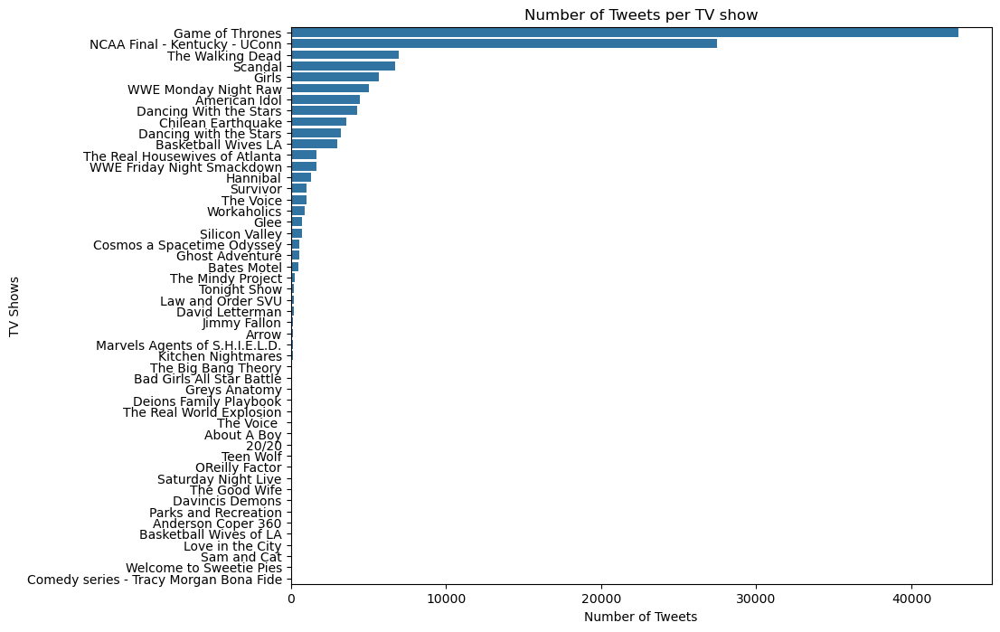

In [18]:
plt.figure(figsize=(10,8))
sns.barplot(x='TweetCount', y='ShowName', data=tweets_per_show)
plt.title('Number of Tweets per TV show')
plt.xlabel('Number of Tweets')
plt.ylabel('TV Shows')
plt.show()

In [20]:
tt['CreatedDate']=pd.to_datetime(tt['CreatedDate'])
tt['Date']=tt['CreatedDate'].dt.date

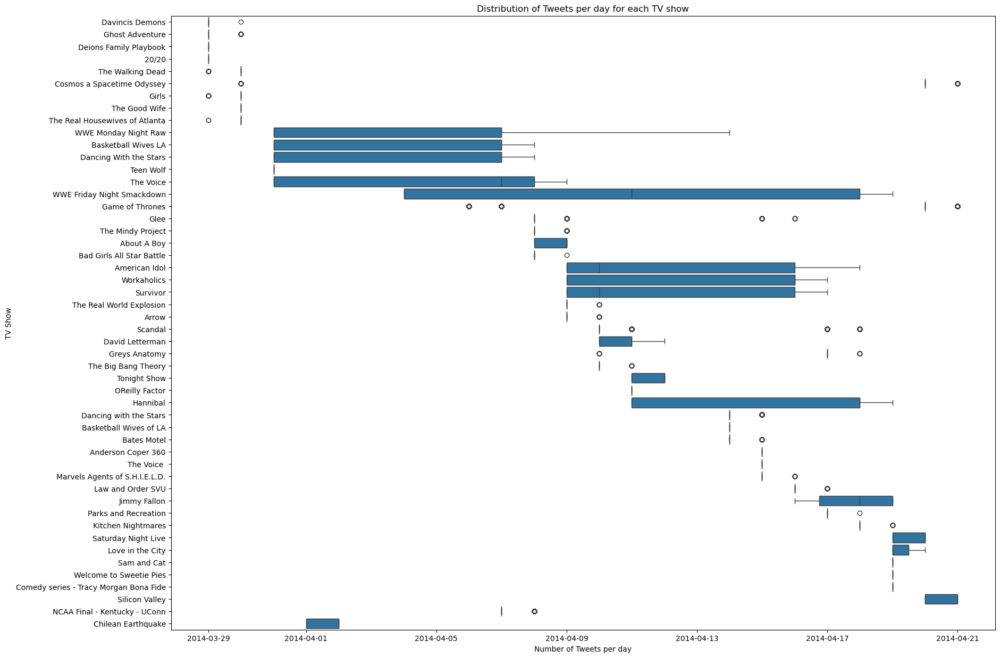

In [24]:
plt.figure(figsize=(20,15))
sns.boxplot(y='ShowName', x='Date', data=tt, orient='h')
plt.title('Distribution of Tweets per day for each TV show')
plt.ylabel('TV Show')
plt.xlabel('Number of Tweets per day')
#plt.xticks(rotation=45)
plt.show()

In [26]:
time_series_data = tt.groupby(['Date','ShowName']).size().reset_index(name='TweetCount')
pivot_data = time_series_data.pivot(index='Date', columns='ShowName', values='TweetCount').fillna(0)

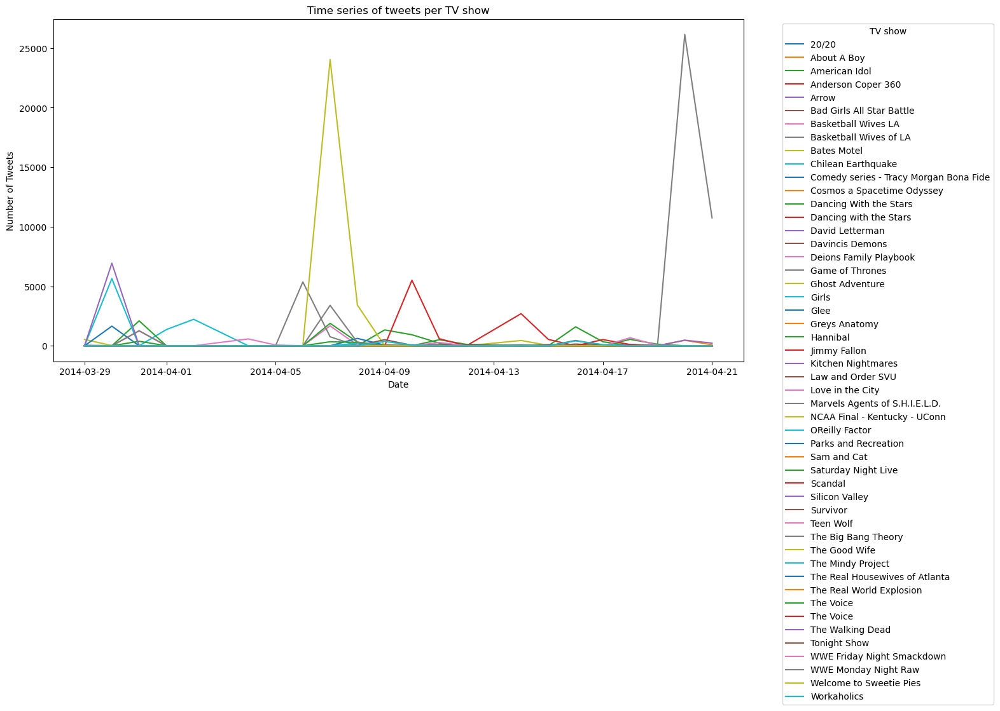

In [29]:
plt.figure(figsize=(14,7))
for column in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[column], label=column)
plt.title('Time series of tweets per TV show')
plt.xlabel('Date')
plt.ylabel('Number of Tweets')
plt.legend(title='TV show', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [32]:
tweets_per_state = tt['State'].value_counts().reset_index()
tweets_per_state.columns = ['State','TweetCount']

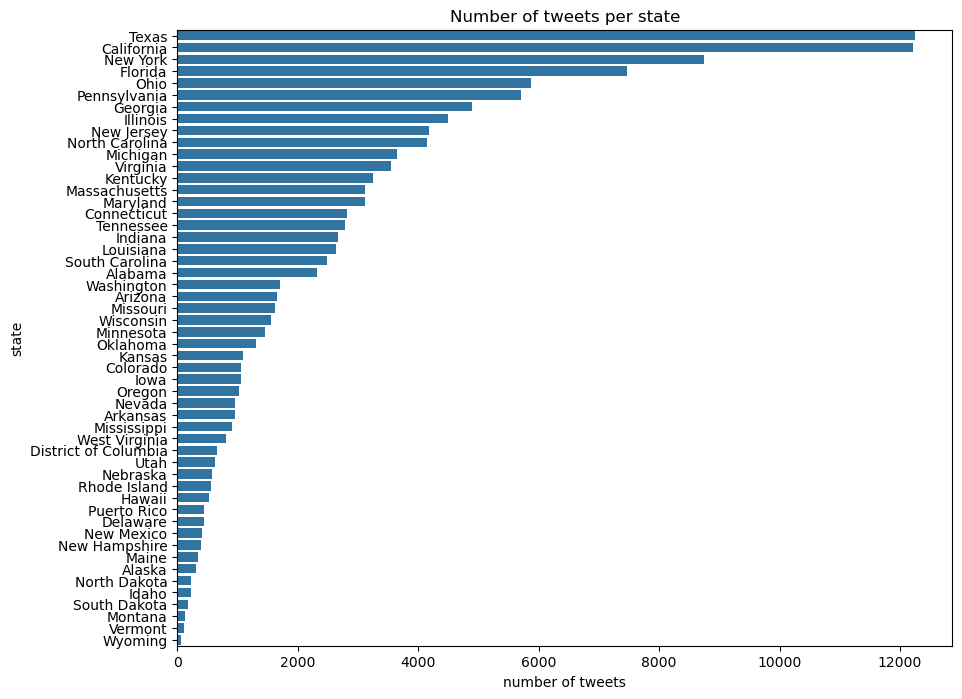

In [35]:
plt.figure(figsize=(10,8))
sns.barplot(x='TweetCount', y='State', data = tweets_per_state)
plt.title('Number of tweets per state')
plt.xlabel('number of tweets')
plt.ylabel('state')
plt.show()

In [47]:
full_data = pd.read_csv('full_extract.csv')

In [48]:
tt1=full_data
tt1.head()

,StateID,State,TweetID,CreatedDate,Lat,Lon,TwitterUserID,TwitterName,Followers,ShowID,ShowName
0,5,Nevada,450090458492854273,2014-03-29 22:01:42-04:00,36.173445,-115.061502,151680843,NUEMONEY,25485,2,Davincis Demons
1,7,New York,450089210834612224,2014-03-29 21:56:44-04:00,40.912401,-73.812712,155094607,Richie_Staz,497,2,Davincis Demons
2,5,Nevada,450108336025780225,2014-03-29 23:12:44-04:00,36.173445,-115.061502,151680843,NUEMONEY,25485,2,Davincis Demons
3,13,Texas,450072139006099456,2014-03-29 20:48:54-04:00,31.889186,-98.625780,2400672156,JadedSch,23,2,Davincis Demons
4,29,Georgia,450090930415370240,2014-03-29 22:03:34-04:00,33.777556,-84.384069,526761281,daylabaldwin,31,2,Davincis Demons


In [49]:
import numpy as np

In [50]:
state_stats = tt1.groupby('State').agg({'TweetID': 'count', 'Followers': 'mean'}).reset_index()
state_stats.columns = ['State', 'TweetCount', 'AvgFollowers']
size = state_stats['AvgFollowers']/np.pi

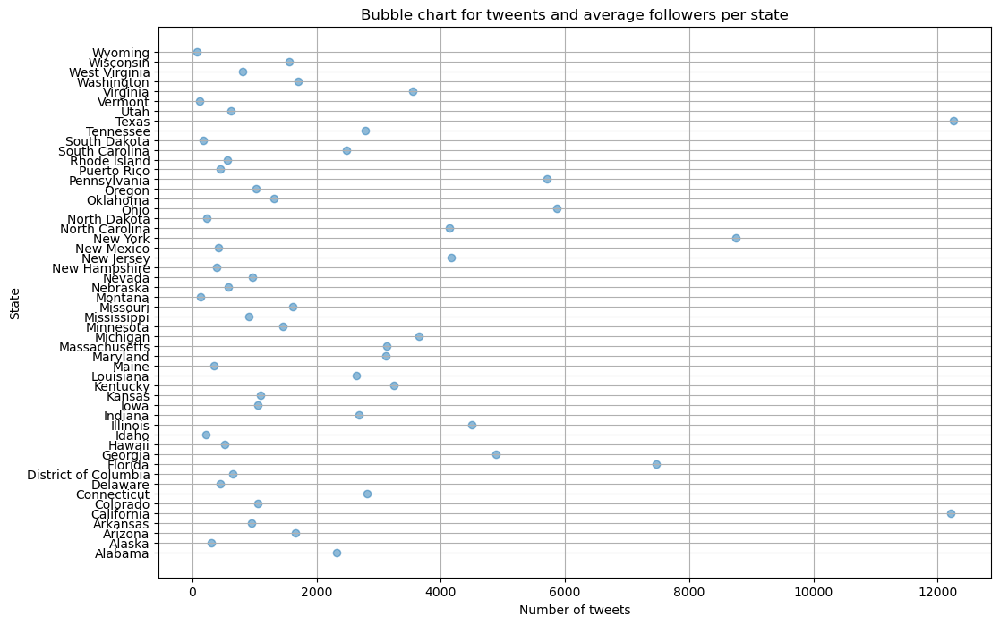

In [52]:
plt.figure(figsize=(12,8))
plt.scatter(x=state_stats['TweetCount'], y=state_stats['State'], alpha=0.5)
plt.title('Bubble chart for tweents and average followers per state')
plt.ylabel('State')
plt.xlabel('Number of tweets')
plt.grid(True)
plt.show()

In [53]:
import plotly.express as px

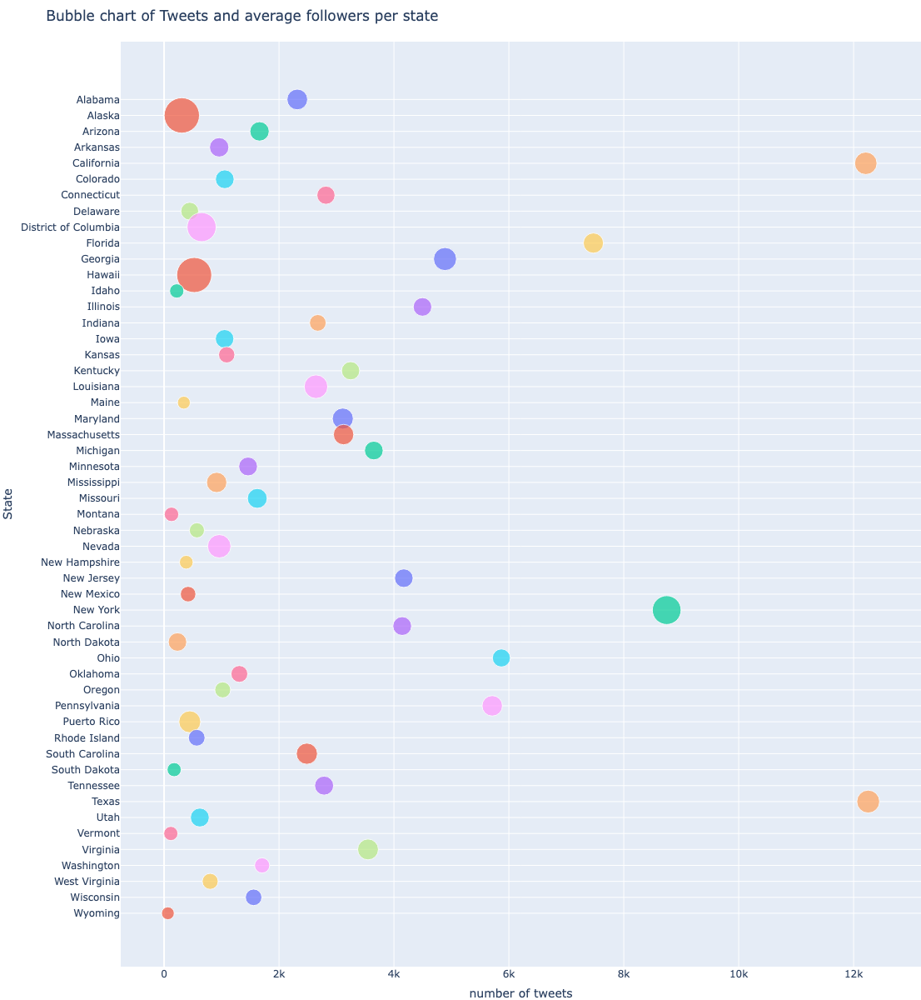

In [56]:
fig = px.scatter(state_stats,
                x='TweetCount',
                y='State',
                size='AvgFollowers',
                hover_name='State',
                color='State',
                size_max=30,
                title="Bubble chart of Tweets and average followers per state",
                height=1200)

fig.update_layout(xaxis_title="number of tweets",
                 yaxis_title="State",
                 showlegend=False,
                 margin=dict(t=50, l=0, b=0, r=0))

fig.show()

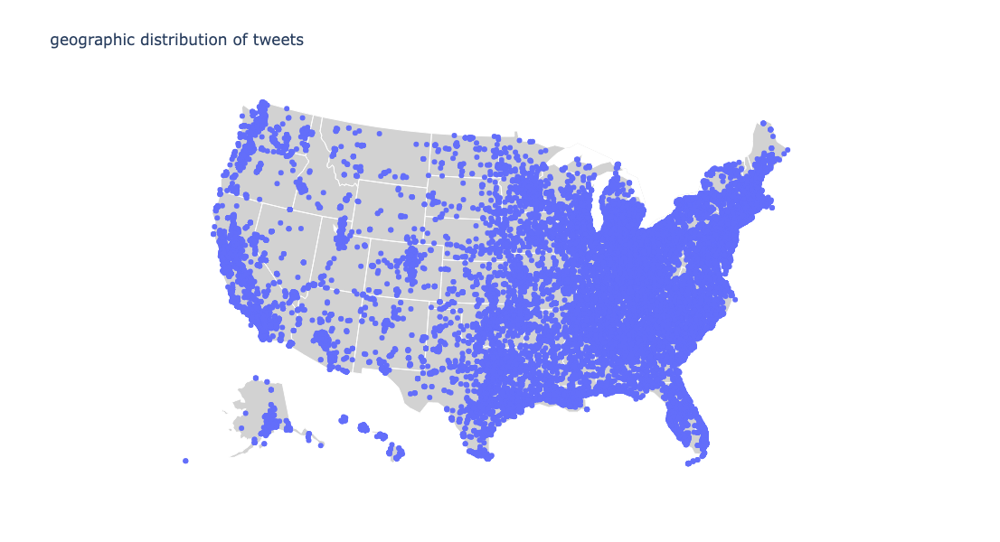

In [61]:
fig1 = px.scatter_geo(tt1,
                     lat='Lat',
                     lon='Lon',
                     hover_name='State',
                     scope='usa',
                     title="geographic distribution of tweets")
fig1.update_layout(
    geo=dict(landcolor='rgb(210,210,210)',),
    width=800,
    height=600
)

fig1.show()